## Env Creative

In [74]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm
import matplotlib.pyplot as plt

## Function to add Gaussian noise to the image

In [75]:
def add_noise(img, noise_level):
    noise = np.random.normal(0, noise_level, img.shape)
    noisy_img = img + noise
    return np.clip(noisy_img, 0, 1)

## Define the DIP model (Assuming a simple CNN architecture)

In [76]:
class DIPModel(nn.Module):
    def __init__(self):
        super(DIPModel, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(64, 3, kernel_size=3, padding=1)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        x = self.relu(self.conv3(x))
        x = self.conv4(x)
        return x

## Define Show Image Function

## Load target image

In [77]:
img_path = '/kaggle/input/lenna-test-image/Lenna_(test_image).png'
target_img = plt.imread(img_path)

In [78]:
if target_img.dtype == np.uint8:
    target_img = target_img / 255.0

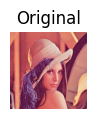

In [79]:
plt.figure(figsize=(3, 1))
plt.title("Original")
plt.imshow(np.clip(target_img, 0, 1))
plt.axis('off')
plt.show(); 

In [80]:
print("Target image range:", target_img.min(), target_img.max())

Target image range: 0.011764706 1.0


## Define noise levels and stages

In [81]:
noise_levels = [0.1, 0.05, 0.025]
noisy_images = [add_noise(target_img, noise_level) for noise_level in noise_levels]

In [82]:
for i, noisy_img in enumerate(noisy_images):
    print(f"Noisy image {i} range:", noisy_img.min(), noisy_img.max())

Noisy image 0 range: 0.0 1.0
Noisy image 1 range: 0.0 1.0
Noisy image 2 range: 0.0 1.0


## Prepare for Training

In [83]:
noisy_images_torch = [torch.tensor(img.transpose(2, 0, 1)).unsqueeze(0).float() for img in noisy_images]
target_img_torch = torch.tensor(target_img.transpose(2, 0, 1)).unsqueeze(0).float()

In [84]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [85]:
noisy_images_torch = [img.to(device) for img in noisy_images_torch]
target_img_torch = target_img_torch.to(device)

In [86]:
model = DIPModel().to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.005)

## Training

In [87]:
num_epochs_per_stage = 5000
best_psnr = 0
best_model = None
psnr_history = []

Training on stage 1 with noise level 0.1


  0%|          | 0/5000 [00:00<?, ?it/s]

Stage: 0, Epoch: 1, PSNR: 5.2340, SSIM: 0.3991


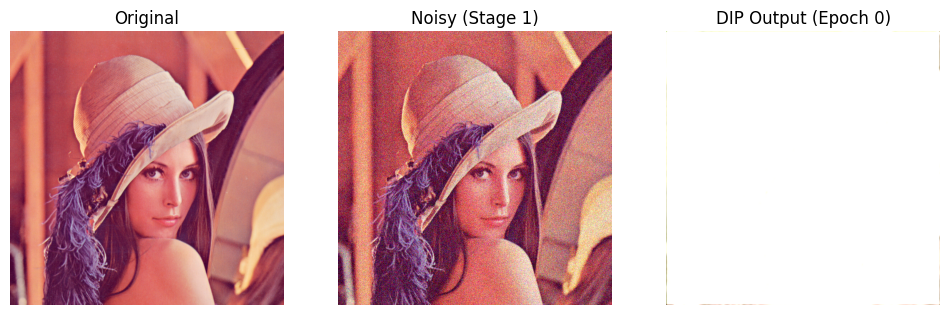

 10%|█         | 501/5000 [00:29<04:31, 16.60it/s]

Stage: 0, Epoch: 501, PSNR: 29.0355, SSIM: 0.7560


<Figure size 640x480 with 0 Axes>

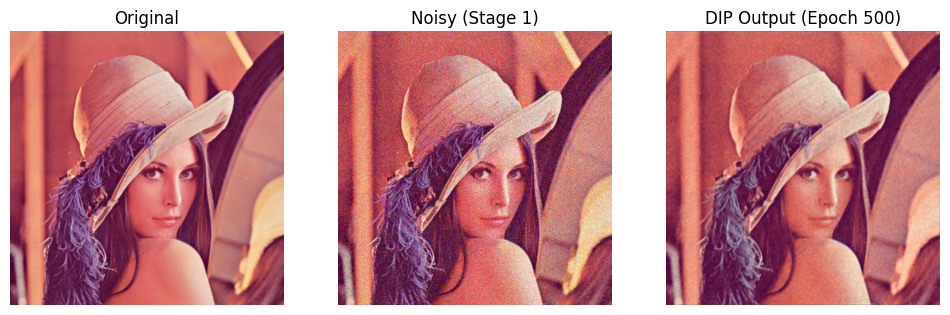

 20%|██        | 1000/5000 [00:59<03:56, 16.93it/s]

Stage: 0, Epoch: 1001, PSNR: 29.7006, SSIM: 0.7690


<Figure size 640x480 with 0 Axes>

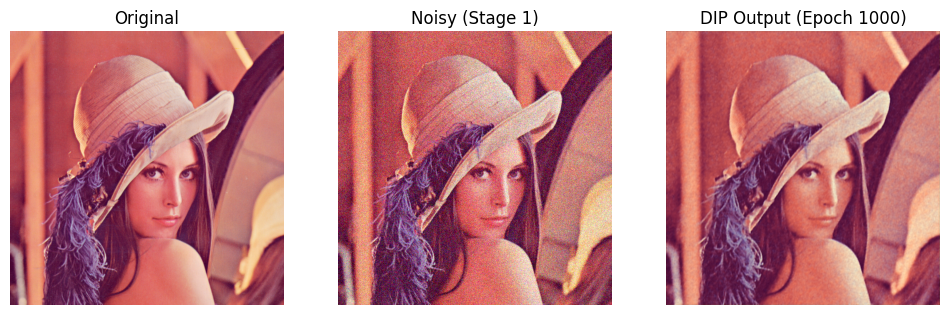

 30%|███       | 1501/5000 [01:29<03:27, 16.82it/s]

Stage: 0, Epoch: 1501, PSNR: 30.0046, SSIM: 0.7777


<Figure size 640x480 with 0 Axes>

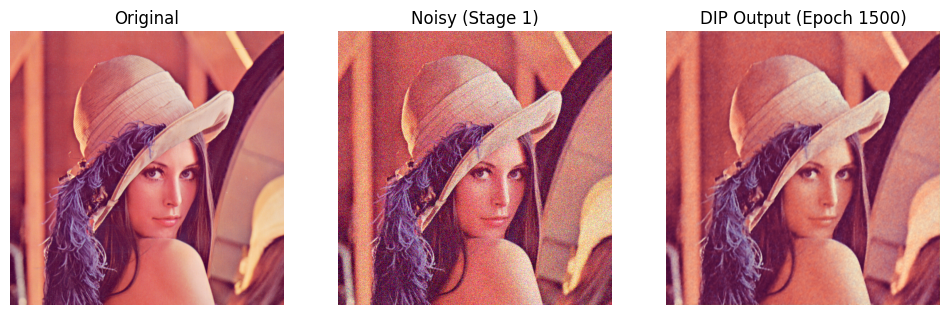

 40%|████      | 2000/5000 [01:59<02:57, 16.86it/s]

Stage: 0, Epoch: 2001, PSNR: 30.0430, SSIM: 0.7864


<Figure size 640x480 with 0 Axes>

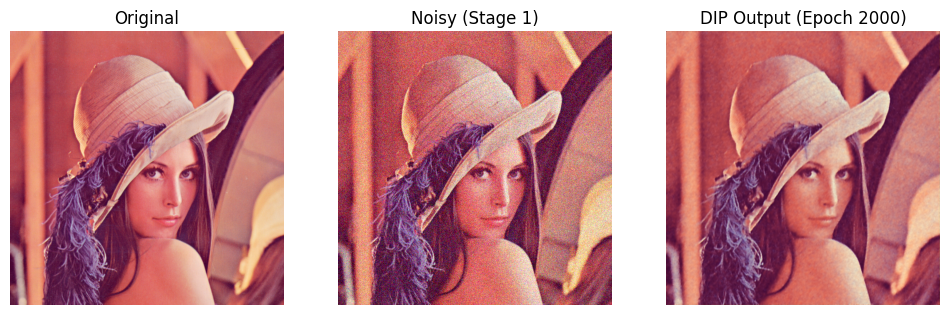

 50%|█████     | 2500/5000 [02:29<02:27, 16.89it/s]

Stage: 0, Epoch: 2501, PSNR: 30.3673, SSIM: 0.7917


<Figure size 640x480 with 0 Axes>

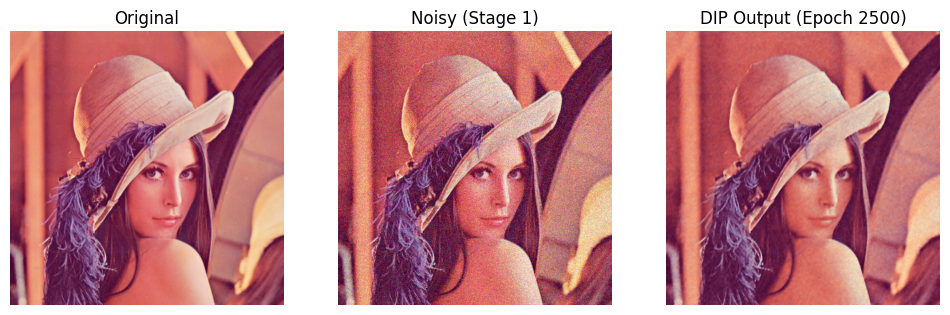

 60%|██████    | 3000/5000 [02:59<01:57, 16.95it/s]

Stage: 0, Epoch: 3001, PSNR: 30.1092, SSIM: 0.7963


<Figure size 640x480 with 0 Axes>

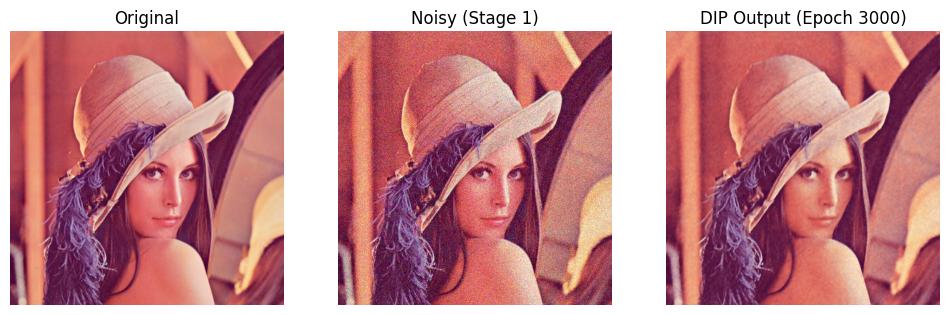

 70%|███████   | 3500/5000 [03:30<01:28, 16.97it/s]

Stage: 0, Epoch: 3501, PSNR: 30.7333, SSIM: 0.7986


<Figure size 640x480 with 0 Axes>

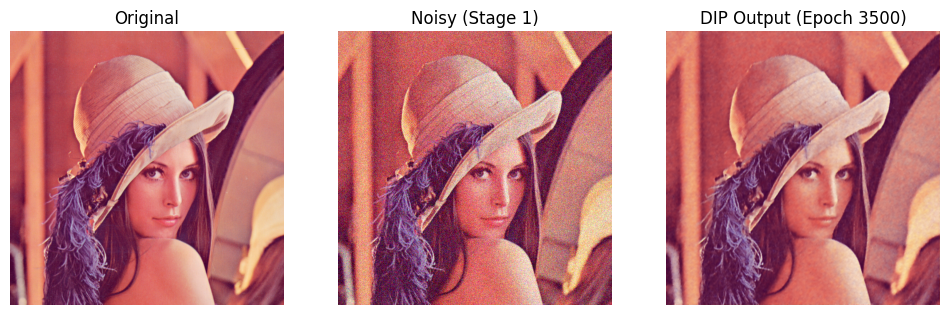

 80%|████████  | 4000/5000 [04:00<00:59, 16.94it/s]

Stage: 0, Epoch: 4001, PSNR: 30.5150, SSIM: 0.8011


<Figure size 640x480 with 0 Axes>

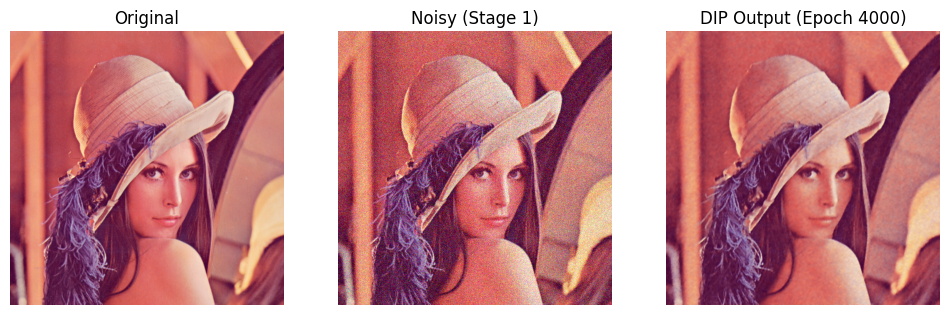

 90%|█████████ | 4500/5000 [04:30<00:29, 16.81it/s]

Stage: 0, Epoch: 4501, PSNR: 30.7653, SSIM: 0.8036


<Figure size 640x480 with 0 Axes>

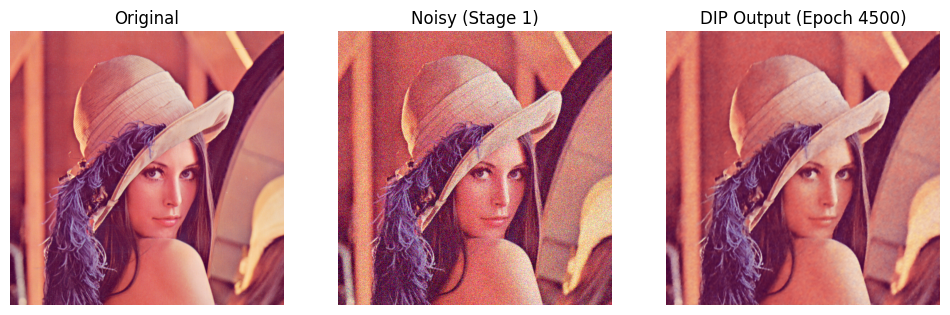

100%|██████████| 5000/5000 [05:00<00:00, 16.64it/s]


Training on stage 2 with noise level 0.05


  0%|          | 0/5000 [00:00<?, ?it/s]

Stage: 1, Epoch: 1, PSNR: 31.5409, SSIM: 0.8470


<Figure size 640x480 with 0 Axes>

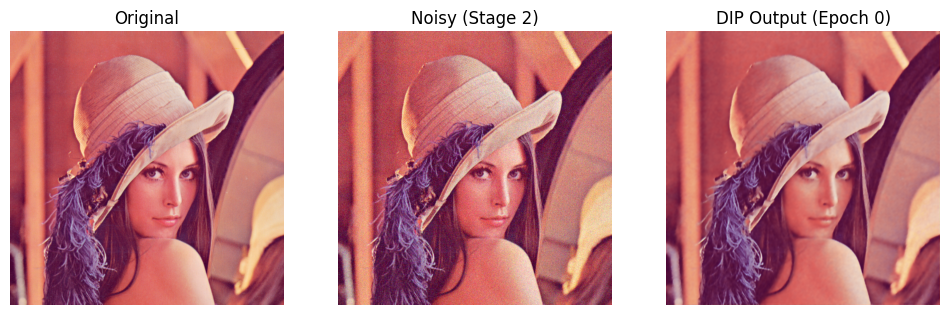

 10%|█         | 501/5000 [00:30<04:24, 16.99it/s]

Stage: 1, Epoch: 501, PSNR: 33.0512, SSIM: 0.8650


<Figure size 640x480 with 0 Axes>

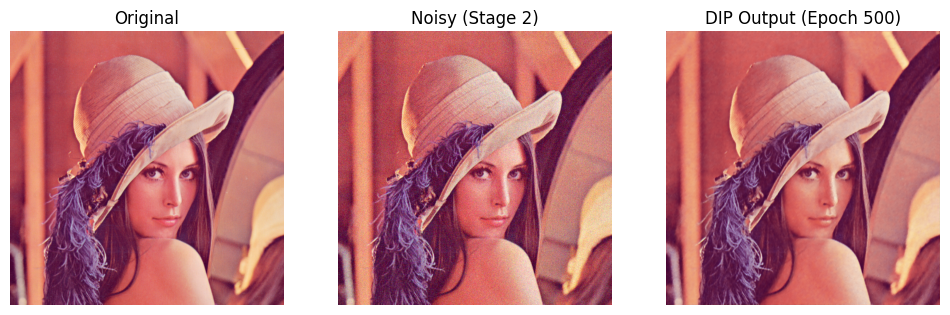

 20%|██        | 1000/5000 [01:00<03:56, 16.92it/s]

Stage: 1, Epoch: 1001, PSNR: 33.1194, SSIM: 0.8662


<Figure size 640x480 with 0 Axes>

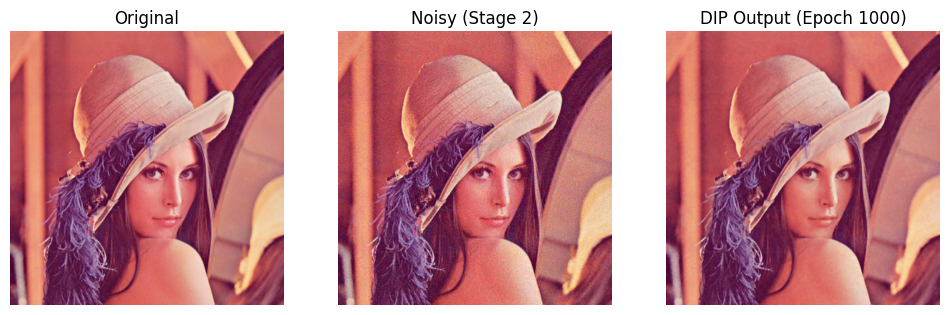

 30%|███       | 1500/5000 [01:30<03:26, 16.93it/s]

Stage: 1, Epoch: 1501, PSNR: 33.0469, SSIM: 0.8668


<Figure size 640x480 with 0 Axes>

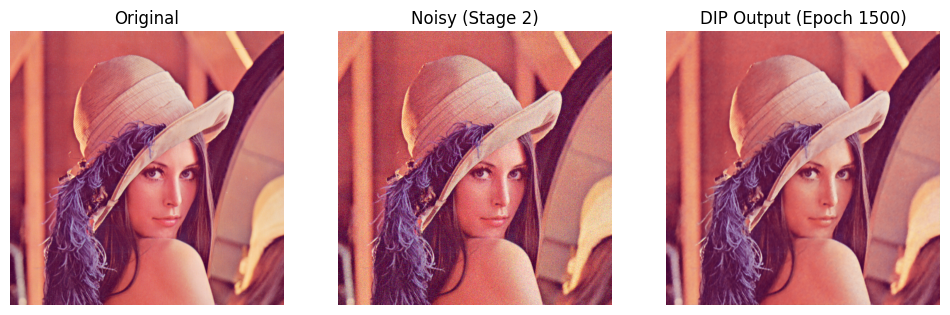

 40%|████      | 2000/5000 [02:00<02:57, 16.90it/s]

Stage: 1, Epoch: 2001, PSNR: 32.7188, SSIM: 0.8682


<Figure size 640x480 with 0 Axes>

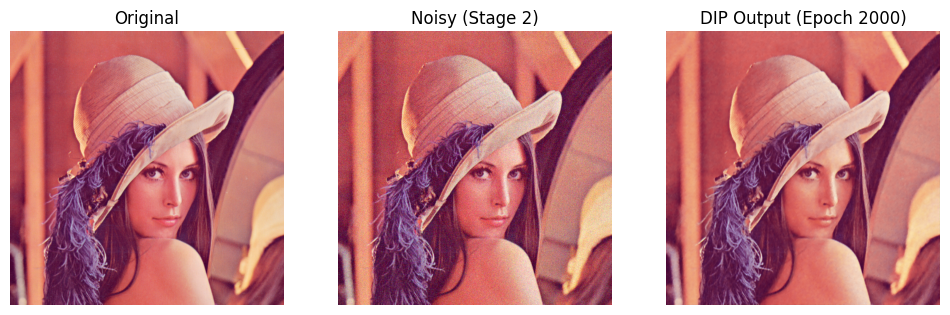

 50%|█████     | 2500/5000 [02:31<02:28, 16.84it/s]

Stage: 1, Epoch: 2501, PSNR: 33.2516, SSIM: 0.8691


<Figure size 640x480 with 0 Axes>

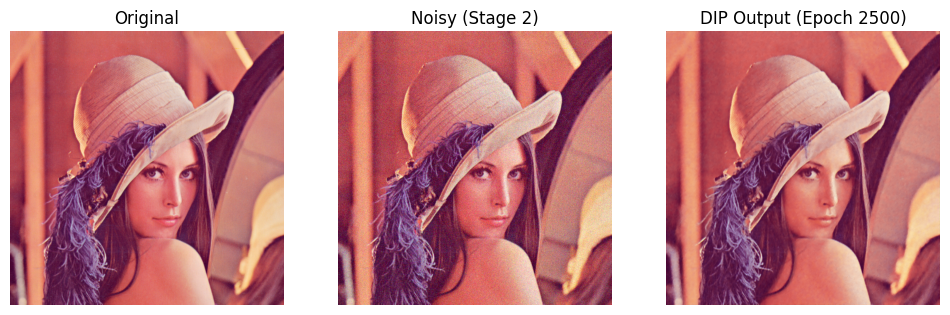

 60%|██████    | 3000/5000 [03:01<01:57, 16.95it/s]

Stage: 1, Epoch: 3001, PSNR: 33.3077, SSIM: 0.8699


<Figure size 640x480 with 0 Axes>

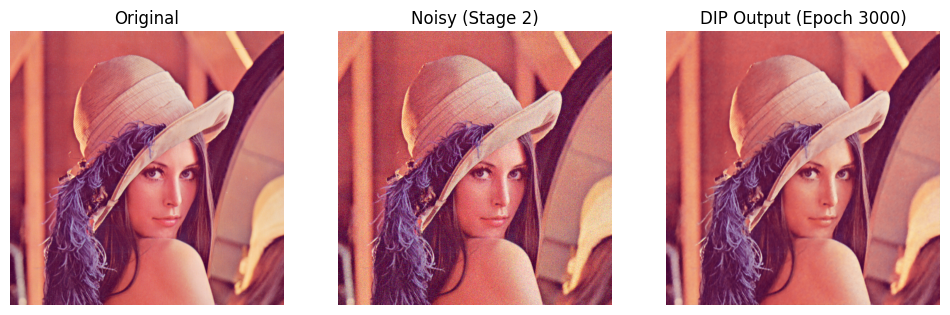

 70%|███████   | 3500/5000 [03:31<01:29, 16.80it/s]

Stage: 1, Epoch: 3501, PSNR: 33.1012, SSIM: 0.8705


<Figure size 640x480 with 0 Axes>

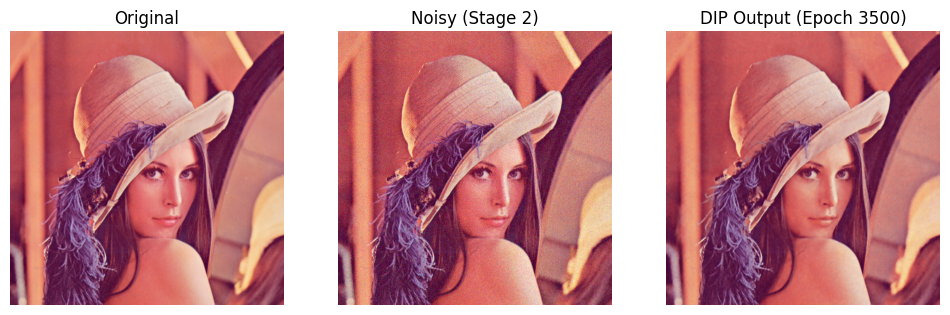

 80%|████████  | 4000/5000 [04:01<00:58, 17.01it/s]

Stage: 1, Epoch: 4001, PSNR: 32.2163, SSIM: 0.8715


<Figure size 640x480 with 0 Axes>

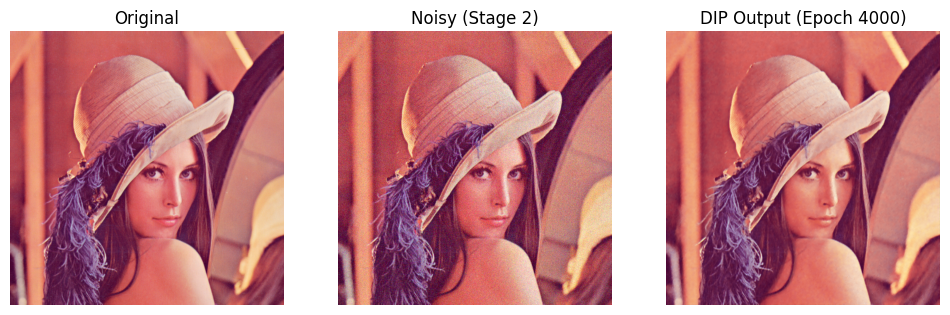

 90%|█████████ | 4500/5000 [04:31<00:29, 16.93it/s]

Stage: 1, Epoch: 4501, PSNR: 31.1671, SSIM: 0.8709


<Figure size 640x480 with 0 Axes>

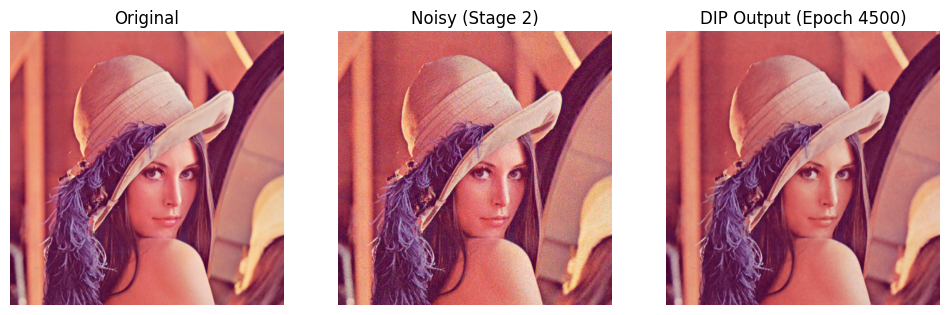

100%|██████████| 5000/5000 [05:01<00:00, 16.58it/s]


Training on stage 3 with noise level 0.025


  0%|          | 0/5000 [00:00<?, ?it/s]

Stage: 2, Epoch: 1, PSNR: 34.4512, SSIM: 0.9011


<Figure size 640x480 with 0 Axes>

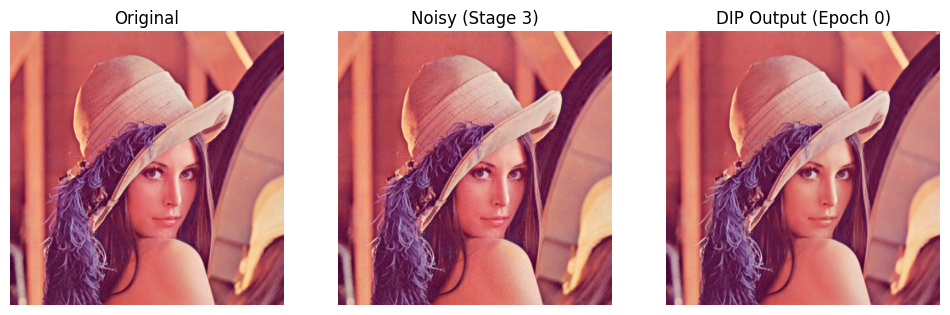

 10%|█         | 500/5000 [00:30<04:28, 16.75it/s]

Stage: 2, Epoch: 501, PSNR: 35.3653, SSIM: 0.9174


<Figure size 640x480 with 0 Axes>

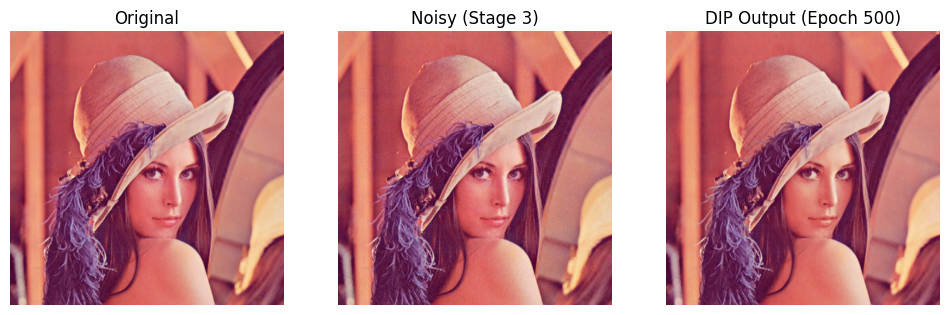

 20%|██        | 1000/5000 [01:00<03:54, 17.03it/s]

Stage: 2, Epoch: 1001, PSNR: 35.4839, SSIM: 0.9186


<Figure size 640x480 with 0 Axes>

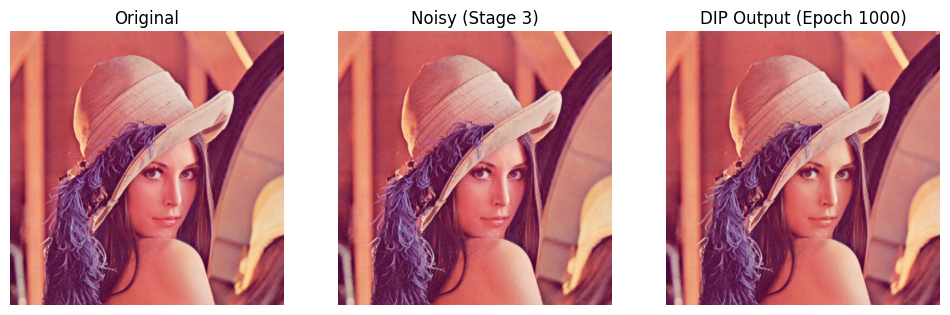

 30%|███       | 1500/5000 [01:30<03:27, 16.88it/s]

Stage: 2, Epoch: 1501, PSNR: 35.2907, SSIM: 0.9188


<Figure size 640x480 with 0 Axes>

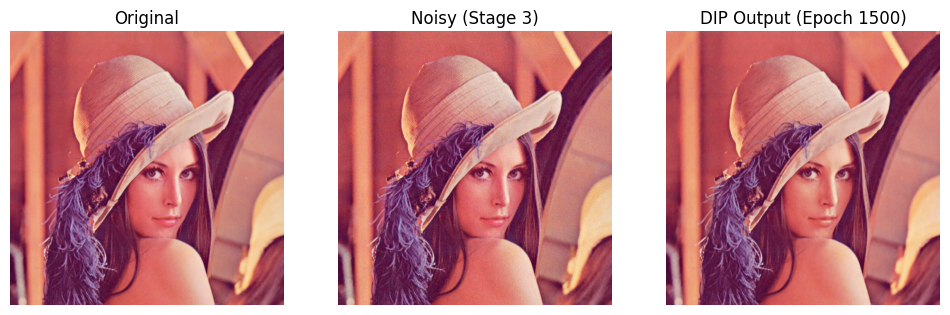

 40%|████      | 2000/5000 [02:00<02:56, 17.04it/s]

Stage: 2, Epoch: 2001, PSNR: 35.4461, SSIM: 0.9191


<Figure size 640x480 with 0 Axes>

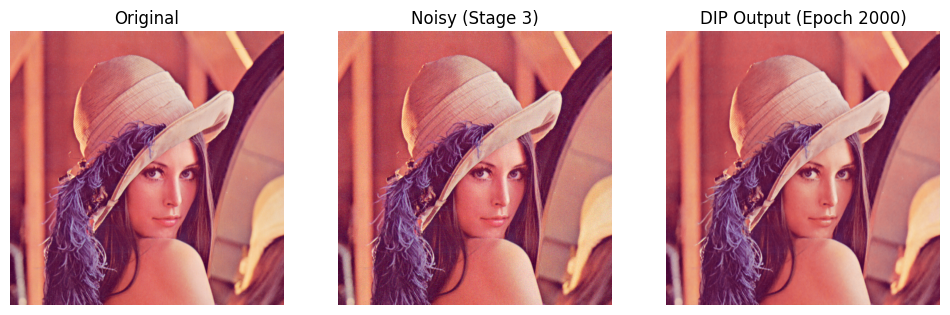

 50%|█████     | 2500/5000 [02:30<02:28, 16.83it/s]

Stage: 2, Epoch: 2501, PSNR: 35.5677, SSIM: 0.9197


<Figure size 640x480 with 0 Axes>

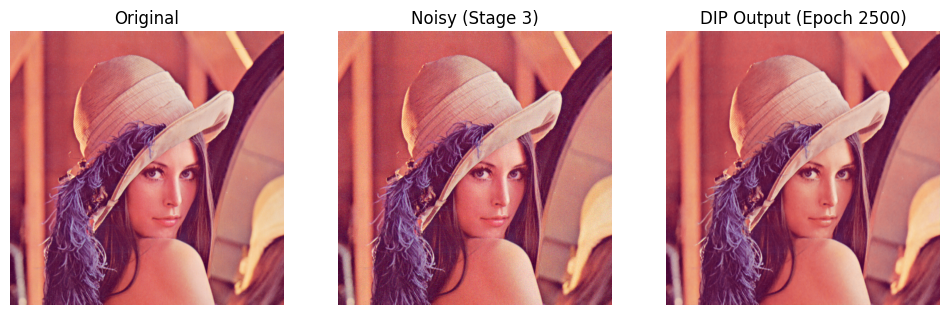

 60%|██████    | 3000/5000 [03:00<01:57, 17.01it/s]

Stage: 2, Epoch: 3001, PSNR: 35.5942, SSIM: 0.9200


<Figure size 640x480 with 0 Axes>

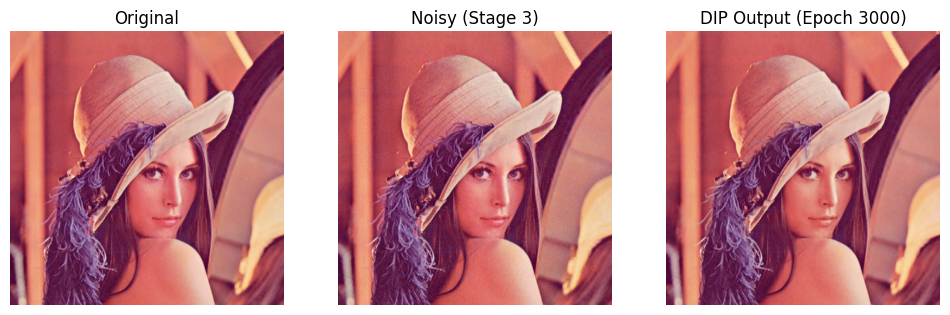

 70%|███████   | 3500/5000 [03:30<01:29, 16.81it/s]

Stage: 2, Epoch: 3501, PSNR: 35.3041, SSIM: 0.9198


<Figure size 640x480 with 0 Axes>

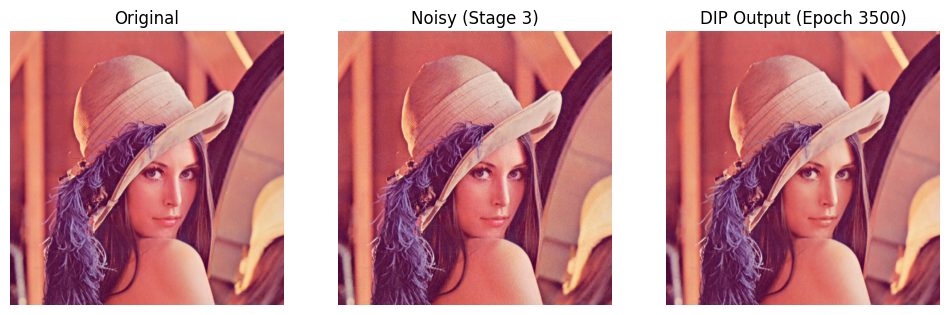

 80%|████████  | 4000/5000 [04:01<00:59, 16.90it/s]

Stage: 2, Epoch: 4001, PSNR: 35.5557, SSIM: 0.9195


<Figure size 640x480 with 0 Axes>

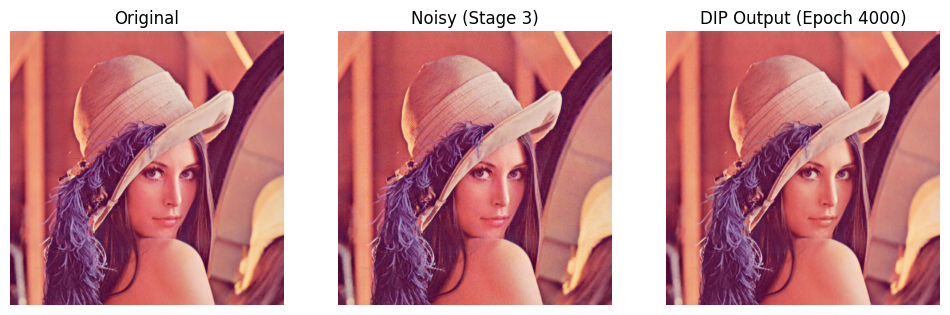

 90%|█████████ | 4500/5000 [04:31<00:29, 16.96it/s]

Stage: 2, Epoch: 4501, PSNR: 35.8480, SSIM: 0.9179


<Figure size 640x480 with 0 Axes>

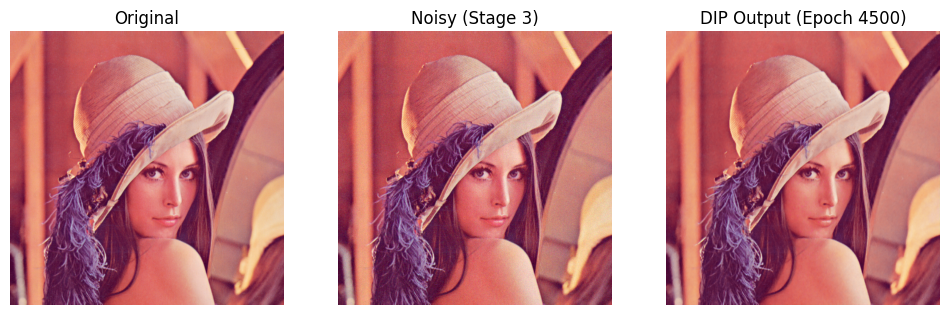

100%|██████████| 5000/5000 [05:01<00:00, 16.58it/s]


<Figure size 640x480 with 0 Axes>

In [88]:
for stage, noisy_img_torch in enumerate(noisy_images_torch):
    print(f"Training on stage {stage + 1} with noise level {noise_levels[stage]}")
    for epoch in tqdm(range(num_epochs_per_stage)):
        model.train()
        optimizer.zero_grad()
        output = model(noisy_img_torch)
        loss = criterion(output, target_img_torch)
        loss.backward()
        optimizer.step()

        if (epoch - 1) % 500 == 0 or epoch - 1 == num_epochs_per_stage:
            model.eval()
            with torch.no_grad():
                output_img = output.squeeze().cpu().detach().numpy().transpose(1, 2, 0)
                output_img = np.clip(output_img, 0, 1)
                current_psnr = psnr(target_img, output_img, data_range=1.0)
                current_ssim = ssim(target_img, output_img, data_range=1.0, channel_axis=-1)
                psnr_history.append(current_psnr)
                print(f"Stage: {stage}, Epoch: {epoch}, PSNR: {current_psnr:.4f}, SSIM: {current_ssim:.4f}")

                # Plot and save the current output image
                plt.figure(figsize=(12, 4))
                plt.subplot(1, 3, 1)
                plt.title("Original")
                plt.imshow(np.clip(target_img, 0, 1))
                plt.axis('off')
                plt.subplot(1, 3, 2)
                plt.title(f"Noisy (Stage {stage + 1})")
                plt.imshow(np.clip(noisy_images[stage], 0, 1))
                plt.axis('off')
                plt.subplot(1, 3, 3)
                plt.title(f"DIP Output (Epoch {epoch - 1})")
                plt.imshow(output_img)
                plt.axis('off')
                plt.show()
                plt.savefig(f'stage_{stage + 1}_epoch_{epoch - 1}.png')

                # Check for early stopping
                if current_psnr > best_psnr:
                    best_psnr = current_psnr
                    best_model = model.state_dict()

In [89]:
model.load_state_dict(best_model)

<All keys matched successfully>

## Evaluation

In [90]:
model.eval()
with torch.no_grad():
    final_output = model(target_img_torch).squeeze().cpu().detach().numpy().transpose(1, 2, 0)
    final_output = np.clip(final_output, 0, 1)
    final_psnr = psnr(target_img, output_img, data_range=1.0)
    final_ssim = ssim(target_img, output_img, data_range=1.0, channel_axis=-1)
    print(f"Final PSNR: {final_psnr:.4f}, Final SSIM: {final_ssim:.4f}")

Final PSNR: 35.8480, Final SSIM: 0.9179


## Visulize the result

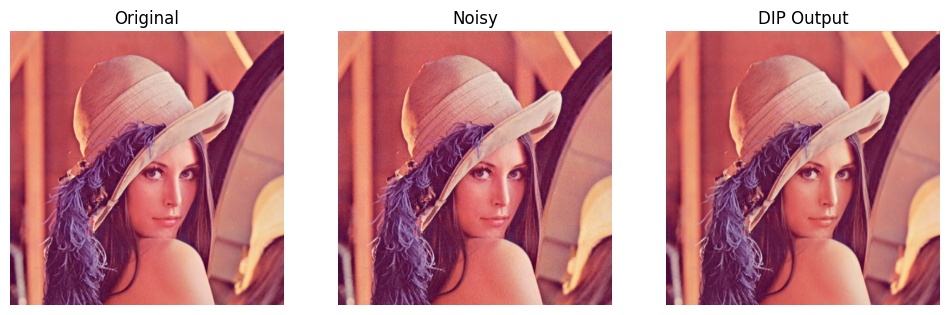

In [91]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.title("Original")
plt.imshow(np.clip(target_img, 0, 1))  # Clip target image to [0, 1] range
plt.axis('off')
plt.subplot(1, 3, 2)
plt.title("Noisy")
plt.imshow(np.clip(noisy_images[-1], 0, 1))  # Clip noisy image to [0, 1] range
plt.axis('off')
plt.subplot(1, 3, 3)
plt.title("DIP Output")
plt.imshow(final_output)
plt.axis('off')
plt.show()